In [1]:
import os; 
from os import listdir
from os.path import join, isdir

import time
import email

import numpy as np

import pandas as pd
pd.options.display.max_rows = 999
pd.set_option('display.max_colwidth', 300)

import matplotlib.pyplot as plt

path = "./data/enron_mail_20150507/maildir/"

folders = ["sent", "sent_items", "_sent_mail"]

In [3]:
users = [user for user in listdir(path) if isdir(join(path, user))]
mails = []

abs_start = start = time.time()
for user in users:
    for folder in folders:
        if folder not in listdir(join(path, user)): continue
        for file in listdir(join(path, user, folder)):
            if isdir(join(path, user, folder, file)): continue
            with open(join(path, user, folder, file), "r", errors="ignore") as text:
                try: mails.append(email.message_from_string(text.read()))
                except: print(user, folder, file)
    print(f"load {user} mail took", round(time.time() -start, 2), "seconds")
    start = time.time()
print("Total time:", round(time.time() -abs_start, 2), "seconds")

load zufferli-j mail took 0.21 seconds
load lay-k mail took 0.15 seconds
load gang-l mail took 0.04 seconds
load dasovich-j mail took 2.98 seconds
load tholt-j mail took 0.35 seconds
load carson-m mail took 0.23 seconds
load ermis-f mail took 0.02 seconds
load whalley-g mail took 0.08 seconds
load south-s mail took 0.02 seconds
load holst-k mail took 0.02 seconds
load jones-t mail took 2.1 seconds
load lavorato-j mail took 0.88 seconds
load pimenov-v mail took 0.04 seconds
load mann-k mail took 4.6 seconds
load horton-s mail took 0.38 seconds
load buy-r mail took 0.36 seconds
load king-j mail took 0.01 seconds
load whalley-l mail took 0.29 seconds
load guzman-m mail took 0.17 seconds
load keavey-p mail took 0.08 seconds
load lenhart-m mail took 1.39 seconds
load williams-j mail took 0.06 seconds
load kean-s mail took 1.05 seconds
load rogers-b mail took 0.88 seconds
load campbell-l mail took 0.33 seconds
load steffes-j mail took 0.73 seconds
load schoolcraft-d mail took 0.31 seconds
lo

In [4]:
df = pd.DataFrame()
df["Content"] = list(map(lambda x: x.get_payload(), mails))

fields = mails[0].keys()
start = time.time()
for field in fields:
    df[field] = [mail[field] for mail in mails]
print("Took", round(time.time() -start, 2), "seconds")

Took 5.25 seconds


<AxesSubplot:>

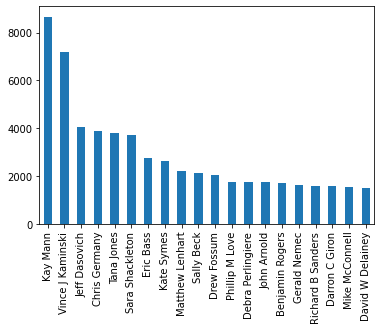

In [5]:
df["X-From"].value_counts()[:20].plot.bar()

<AxesSubplot:>

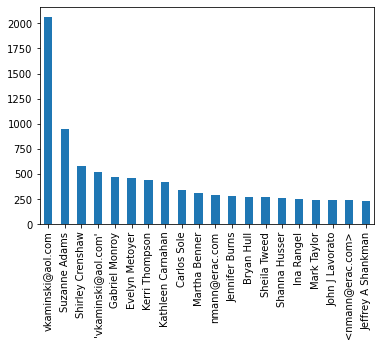

In [6]:
df["X-To"].value_counts()[:20].plot.bar()

<AxesSubplot:>

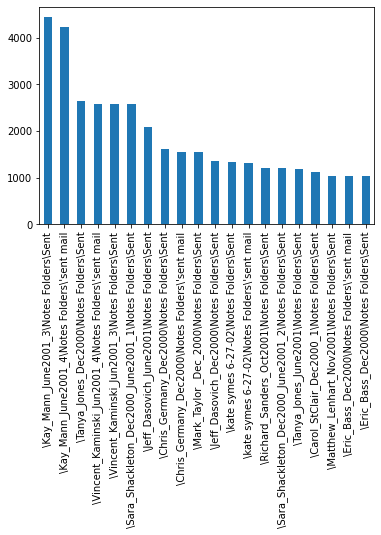

In [7]:
df["X-Folder"].value_counts()[:20].plot.bar()

<AxesSubplot:>

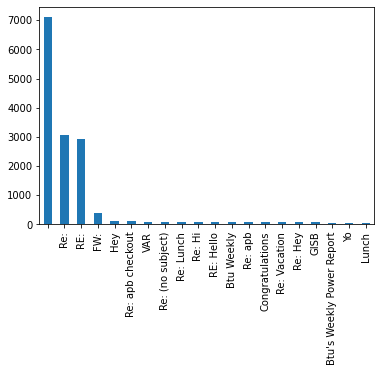

In [8]:
df["Subject"].value_counts()[:20].plot.bar()

In [9]:
df.to_csv("mails.csv")

In [97]:
df.loc[0, "Date"]

'Tue, 5 Jun 2001 08:26:00 -0700 (PDT)'

In [10]:
df.sort_values(["X-Origin"], inplace=True)
df.reset_index(inplace=True)

In [22]:
df = df.replace(r'\\n',' ', regex=True)

# Load data

In [3]:
import pandas as pd

df = pd.read_csv('./data/sortedemails.csv')

#convert columns to datetime
df['Date'] = pd.to_datetime(df['Date'],utc=True)


In [4]:
df['calenderdate'] = df['Date'].apply(lambda x : x.date())

In [5]:
df['calenderdate']

0         2001-05-10
1         2001-05-13
2         2001-02-07
3         2001-02-07
4         2001-01-22
             ...    
125677    2001-11-06
125678    2001-12-02
125679    2001-12-10
125680    2001-11-28
125681    2001-11-16
Name: calenderdate, Length: 125682, dtype: object

In [57]:
df

,Date,index,Content,Message-ID,Date.1,From,To,Subject,Mime-Version,Content-Type,Content-Transfer-Encoding,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName
0,2001-05-10 14:16:00+00:00,42421,---------------------- Forwarded by John Arnol...,<25702046.1075849632104.JavaMail.evans@thyme>,2001-05-10 14:16:00+00:00,john.arnold@enron.com,mike.maggi@enron.com,Options Advisory Committee Meeting - May 31st,1.0,text/plain; charset=us-ascii,7bit,John Arnold,Mike Maggi,NaN,NaN,\John_Arnold_Oct2001\Notes Folders\Sent,ARNOLD-J,jarnold.nsf
1,2001-05-13 14:52:00+00:00,41964,David:\nDo you have a simulation set up that w...,<28095741.1075849632148.JavaMail.evans@thyme>,2001-05-13 14:52:00+00:00,john.arnold@enron.com,david.forster@enron.com,Re:,1.0,text/plain; charset=us-ascii,7bit,John Arnold,David Forster,NaN,NaN,\John_Arnold_Oct2001\Notes Folders\Sent,ARNOLD-J,jarnold.nsf
2,2001-02-07 11:09:00+00:00,120047,EB2762 !\n\n\n\nFrom: Saji John@ENRON COMMUNIC...,<8307128.1075848347383.JavaMail.evans@thyme>,2001-02-07 11:09:00+00:00,harry.arora@enron.com,saji.john@enron.com,Re: Meeting on RSL Capacity Auctions,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,Saji John,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf
3,2001-02-07 10:50:00+00:00,120039,That sounds good.\n\n\nHarry\n\n\n\nFrom: Saji...,<24219499.1075848347361.JavaMail.evans@thyme>,2001-02-07 10:50:00+00:00,harry.arora@enron.com,saji.john@enron.com,Re: Meeting on RSL Capacity Auctions,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,Saji John,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf
4,2001-01-22 18:36:00+00:00,120040,Dave\n\nFind enclosed the business plan and th...,<30442669.1075848347294.JavaMail.evans@thyme>,2001-01-22 18:36:00+00:00,harry.arora@enron.com,dave.samuels@enron.com,Business Plan,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,Dave Samuels,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125677,2001-11-06 20:09:33+00:00,95714,PLEASE STOP REPLYING TO ALL USERS,<28817774.1075861170575.JavaMail.evans@thyme>,2001-11-06 20:09:33+00:00,andy.zipper@enron.com,"cynthia.vasquez@enron.com, dorina.garcia@enron...",RE: IIS changes,1.0,text/plain; charset=us-ascii,7bit,"Zipper, Andy </O=ENRON/OU=NA/CN=RECIPIENTS/CN=...","Vasquez, Cynthia </O=ENRON/OU=NA/CN=RECIPIENTS...",DL-01V Users </O=ENRON/OU=NA/CN=RECIPIENTS/CN=...,NaN,"\AZIPPER (Non-Privileged)\Zipper, Andy\Sent Items",Zipper-A,AZIPPER (Non-Privileged).pst
125678,2001-12-02 15:45:51+00:00,95718,Spoke with Rick Stuckey who advised me that a ...,<15553719.1075859061293.JavaMail.evans@thyme>,2001-12-02 15:45:51+00:00,andy.zipper@enron.com,"greg.whalley@enron.com, john.lavorato@enron.co...",Citi,1.0,text/plain; charset=us-ascii,7bit,"Zipper, Andy </O=ENRON/OU=NA/CN=RECIPIENTS/CN=...","Whalley, Greg </O=ENRON/OU=NA/CN=RECIPIENTS/CN...",NaN,NaN,"\Andrew_Zipper_Jan2002\Zipper, Andy\Sent Items",Zipper-A,azipper (Non-Privileged).pst
125679,2001-12-10 19:30:41+00:00,95722,i'm considering this terminated.,<21440385.1075859061532.JavaMail.evans@thyme>,2001-12-10 19:30:41+00:00,andy.zipper@enron.com,monica.l.brown@accenture.com,RE: Reminder: Risk Management Simulation Quest...,1.0,text/plain; charset=us-ascii,7bit,"Zipper, Andy </O=ENRON/OU=NA/CN=RECIPIENTS/CN=...",'monica.l.brown@accenture.com',NaN,NaN,"\Andrew_Zipper_Jan2002\Zipper, Andy\Sent Items",Zipper-A,azipper (Non-Privileged).pst
125680,2001-11-28 17:58:42+00:00,95698,"Thanks, I think I am okay, but let's talk toni...",<8611097.1075859061118.JavaMail.evans@thyme>,2001-11-28 17:58:42+00:00,andy.zipper@enron.com,lottyplace@yahoo.com,RE: ENE/DYN,1.0,text/plain; charset=us-ascii,7bit,"Zipper, Andy </O=ENRON/OU=NA/CN=RECIPIENTS/CN=...",'E. M. Malone' <lottyplace@yahoo.com>,NaN,NaN,"\Andrew_Zipper_Jan2002\Zipper, Andy\Sent Items",Zipper-A,azipper (Non-Privileged).pst


In [15]:
#Emails per employee per day

data = df.groupby(['From','calenderdate'])['Content'].count().reset_index()


In [17]:
import seaborn as sns
sns.(data=data, x='calenderdate',y='Content')

AttributeError: module 'seaborn' has no attribute 'plot'

# Make days at company feature

In [60]:
start = df.Date.min()
end = df.Date.max()

In [88]:
g = df.groupby('From')['Date']
daysatcompany = g.last() - g.first()

daysatcompany.sort_values().tail(10)


From
rosalee.fleming@enron.com     310 days 01:17:00
rod.hayslett@enron.com        316 days 00:09:32
sherri.sera@enron.com         332 days 01:59:00
carol.clair@enron.com         391 days 22:39:00
debra.perlingiere@enron.com   407 days 04:59:49
mike.grigsby@enron.com        420 days 05:24:15
susan.scott@enron.com         427 days 05:59:00
gerald.nemec@enron.com        449 days 10:09:35
michelle.lokay@enron.com      483 days 07:38:50
tana.jones@enron.com          672 days 05:10:03
Name: Date, dtype: timedelta64[ns]

In [97]:
mask = (df['From'].value_counts() > 1)
mask.value_counts()

True     221
False     39
Name: From, dtype: int64

In [165]:
daysatcompany.dtype

dtype('<m8[ns]')

In [157]:
daysatcompany

From
40enron@enron.com               0 days 00:00:00
a..howard@enron.com             0 days 00:00:00
a..martin@enron.com          -98 days +22:17:59
a..shankman@enron.com        -38 days +21:39:57
albert.meyers@enron.com       -3 days +20:24:52
                                    ...        
vladi.pimenov@enron.com      -66 days +06:54:21
w..delainey@enron.com          13 days 20:54:33
w..pereira@enron.com           61 days 20:50:09
w..white@enron.com           -92 days +17:26:41
zionette.vincent@enron.com     11 days 23:51:00
Name: Date, Length: 260, dtype: timedelta64[ns]

In [ ]:
# Make hired feature

In [ ]:
# Make fired feature

In [ ]:
def fired():
    for x in len(daysatcompany):
        if daysatcompany[x].days > 1:
            

In [105]:
df[df['From'].str.contains('sara')]

,Date,index,Content,Message-ID,Date.1,From,To,Subject,Mime-Version,Content-Type,Content-Transfer-Encoding,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName
98482,2001-06-07 08:42:00+00:00,114670,Stephanie:\n\nPlease email to Valentis our L/C...,<20597478.1075844930676.JavaMail.evans@thyme>,2001-06-07 08:42:00+00:00,sara.shackleton@enron.com,stephanie.panus@enron.com,FW: ISDA Agreement - Valentis,1.0,text/plain; charset=us-ascii,7bit,Sara Shackleton,Stephanie Panus,Paul Radous,NaN,\Sara_Shackleton_Dec2000_June2001_2\Notes Fold...,SHACKLETON-S,sshackle.nsf
98483,2000-05-12 14:51:00+00:00,114669,"At end of first paragraph, add: Terms used bu...",<3632549.1075844550994.JavaMail.evans@thyme>,2000-05-12 14:51:00+00:00,sara.shackleton@enron.com,jarrod.cyprow@enron.com,Vitol,1.0,text/plain; charset=us-ascii,7bit,Sara Shackleton,Jarrod Cyprow,NaN,NaN,\Sara_Shackleton_Dec2000_June2001_1\Notes Fold...,SHACKLETON-S,sshackle.nsf
98484,2000-06-09 15:56:00+00:00,114668,----- Forwarded by Sara Shackleton/HOU/ECT on ...,<14257921.1075844555045.JavaMail.evans@thyme>,2000-06-09 15:56:00+00:00,sara.shackleton@enron.com,clint.freeland@enron.com,ISDA Master Agreement,1.0,text/plain; charset=us-ascii,7bit,Sara Shackleton,Clint Freeland,NaN,NaN,\Sara_Shackleton_Dec2000_June2001_1\Notes Fold...,SHACKLETON-S,sshackle.nsf
98485,2000-11-15 13:20:00+00:00,114686,Here it is\n----- Forwarded by Sara Shackleton...,<12832756.1075844575744.JavaMail.evans@thyme>,2000-11-15 13:20:00+00:00,sara.shackleton@enron.com,robert.bruce@enron.com,P&G ISDA Schedule,1.0,text/plain; charset=us-ascii,7bit,Sara Shackleton,Robert Bruce,NaN,NaN,\Sara_Shackleton_Dec2000_June2001_1\Notes Fold...,SHACKLETON-S,sshackle.nsf
98486,1999-12-15 17:04:00+00:00,114667,"I don't know who's working on this deal, so I'...",<11283608.1075844533723.JavaMail.evans@thyme>,1999-12-15 17:04:00+00:00,sara.shackleton@enron.com,"morris.clark@enron.com, stephen.douglas@enron....",Project Ghost,1.0,text/plain; charset=us-ascii,7bit,Sara Shackleton,"Morris Richard Clark, Stephen H Douglas, Rhett...",Marie Heard,NaN,\Sara_Shackleton_Dec2000_June2001_1\Notes Fold...,SHACKLETON-S,sshackle.nsf
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112844,2001-10-18 15:08:19+00:00,116490,Rhonda: Can you please send me a copy of the ...,<6601620.1075858810339.JavaMail.evans@thyme>,2001-10-18 15:08:19+00:00,sara.shackleton@enron.com,l..denton@enron.com,"Allegheny Energy Supply Company, LLC (""Alleghe...",1.0,text/plain; charset=us-ascii,7bit,"Shackleton, Sara </O=ENRON/OU=NA/CN=RECIPIENTS...","Denton, Rhonda L. </O=ENRON/OU=NA/CN=RECIPIENT...","Hansen, Leslie </O=ENRON/OU=NA/CN=RECIPIENTS/C...",NaN,"\SSHACKL (Non-Privileged)\Shackleton, Sara\Sen...",Shackleton-S,SSHACKL (Non-Privileged).pst
112845,2001-12-17 19:47:36+00:00,116489,Caroline:\n\nI haven't spoken with Frank in se...,<30742083.1075855397203.JavaMail.evans@thyme>,2001-12-17 19:47:36+00:00,sara.shackleton@enron.com,caroline.abramo@enron.com,RE: counterparty processes,1.0,text/plain; charset=us-ascii,7bit,"Shackleton, Sara </O=ENRON/OU=NA/CN=RECIPIENTS...","Abramo, Caroline </O=ENRON/OU=NA/CN=RECIPIENTS...",NaN,NaN,"\Sara_Shackleton_Jan2002\Shackleton, Sara\Sent...",Shackleton-S,sshackl (Non-Privileged).pst
112846,2001-10-08 20:02:36+00:00,116488,Tanya: I think we sent the ENA ISDA to you bu...,<21693866.1075858809074.JavaMail.evans@thyme>,2001-10-08 20:02:36+00:00,sara.shackleton@enron.com,tanya.rohauer@enron.com,"RE: First Union National Bank (""FTU"") ISDA wit...",1.0,text/plain; charset=us-ascii,7bit,"Shackleton, Sara </O=ENRON/OU=NA/CN=RECIPIENTS...","Rohauer, Tanya </O=ENRON/OU=NA/CN=RECIPIENTS/C...",NaN,NaN,"\SSHACKL (Non-Privileged)\Shackleton, Sara\Sen...",Shackleton-S,SSHACKL (Non-Privileged).pst
112847,2002-02-07 23:07:38+00:00,116496,"-----Original Message-----\nFrom: \tSultanik, ...",<502485.1075861050585.JavaMail.evans@thyme>,2002-02-07 23:07:38+00:00,sara.shackleton@enron.com,sshackl@swbell.net,FW: Employees who mis

In [112]:
daysatcompany[daysatcompany.index.str.contains('sara')]


From
sara.shackleton@enron.com   249 days 11:58:09
Name: Date, dtype: timedelta64[ns]

In [63]:
first = df.groupby(['From'])['Date'].min()
last = df.groupby(['From'])['Date'].max()
diff =  df.groupby(['From'])['Date'].diff()

In [68]:
daysatcompany = df.groupby('From')['Date'].apply(lambda x: diff(x.first, x.last))

TypeError: 'Series' object is not callable

In [54]:
tmp = gb.sum().sort_values(by ='Mime-Version', ascending=False).head(10)
names = tmp.index
df1 = df[df.From.isin(names)]

In [55]:
df1.shape

(46035, 18)

In [56]:
df1.to_csv('subset_top10.csv')

In [65]:
gb = df.groupby('Subject')

In [69]:
gb.max()

AssertionError: 

In [166]:
import numpy as np
gb.aggregate(np.size)

,Date,index,Content,Message-ID,Date.1,To,Subject,Mime-Version,Content-Type,Content-Transfer-Encoding,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName
From,,,,,,,,,,,,,,,,,
40enron@enron.com,1,1,1,1,1,1,1,1.0,1,1,1,1,1,1,1,1,1
a..howard@enron.com,1,1,1,1,1,1,1,1.0,1,1,1,1,1,1,1,1,1
a..martin@enron.com,206,206,206,206,206,206,206,206.0,206,206,206,206,206,206,206,206,206
a..shankman@enron.com,59,59,59,59,59,59,59,59.0,59,59,59,59,59,59,59,59,59
albert.meyers@enron.com,11,11,11,11,11,11,11,11.0,11,11,11,11,11,11,11,11,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vladi.pimenov@enron.com,78,78,78,78,78,78,78,78.0,78,78,78,78,78,78,78,78,78
w..delainey@enron.com,59,59,59,59,59,59,59,59.0,59,59,59,59,59,59,59,59,59
w..pereira@enron.com,74,74,74,74,74,74,74,74.0,74,74,74,74,74,74,74,74,74


In [175]:
p = df.groupby(['From'])['Date']
p.size()
#seaborn.heatmap(data,

From
40enron@enron.com               1
a..howard@enron.com             1
a..martin@enron.com           206
a..shankman@enron.com          59
albert.meyers@enron.com        11
                             ... 
vladi.pimenov@enron.com        78
w..delainey@enron.com          59
w..pereira@enron.com           74
w..white@enron.com            437
zionette.vincent@enron.com     11
Name: Date, Length: 260, dtype: int64

<AxesSubplot:xlabel='Date'>

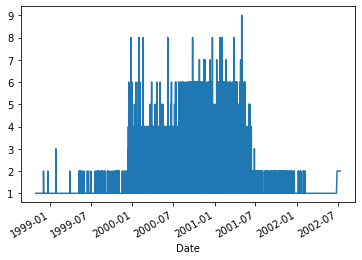

In [167]:
p = df.groupby('Date')['From'].size()
p.plot()

<AxesSubplot:xlabel='Date'>

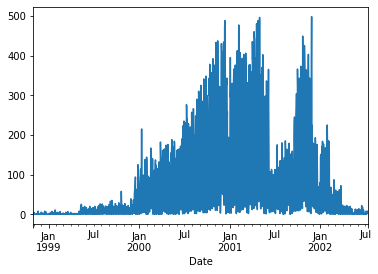

In [4]:
df = df.set_index(pd.DatetimeIndex(df['Date']))
q = df.resample('D').size()
q.plot()

In [128]:
byday = df.groupby(by=df['Date'].dt.date).count()
byday.index.nunique()

1135

In [ ]:
byday = df.groupby(by=df['From.dt.date).count()
byday.index.nunique()

In [ ]:
byday = df.groupby(by=df['Date'].dt.date).count()
byday.index.nunique()

In [129]:
byday.index

Index([1998-10-30, 1998-11-02, 1998-11-04, 1998-11-05, 1998-11-13, 1998-11-19,
       1998-11-20, 1998-11-24, 1998-11-25, 1998-11-30,
       ...
       2002-06-25, 2002-06-28, 2002-07-02, 2002-07-03, 2002-07-05, 2002-07-08,
       2002-07-09, 2002-07-10, 2002-07-11, 2002-07-12],
      dtype='object', name='Date', length=1135)

<AxesSubplot:xlabel='Date'>

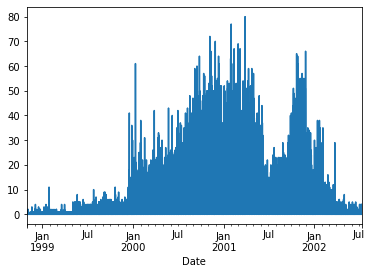

In [176]:
df = df.set_index(pd.DatetimeIndex(df['Date']))
h = df.resample('H').size()
h.plot()

In [178]:
df.groupby('Date').dt.date

ValueError: 'Date' is both an index level and a column label, which is ambiguous.

In [179]:
t = df.groupby('From').resample('D').size()

In [221]:
data = t.reset_index().set_index('Date')


In [213]:
g = t.reset_index().groupby('Date')['From']
g.plot()

TypeError: no numeric data to plot

In [226]:
data = data.reset_index()

In [240]:
df.reset_index(drop=True, inplace=True)

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(15,7))
# use unstack()
df.groupby(['Date','From']).count().unstack().plot(ax=ax)

In [1]:
import pandas as pd
data = pd.read_csv('./data/time_set.csv')

In [2]:
data

,Unnamed: 0,Who,First,Last
0,63,WILLIAMS-J,1986-04-26 07:22:07,2001-06-11 00:05:07
1,155,LOVE-P,1997-01-01 09:22:03,2002-02-06 17:08:03
2,132,KEAN-S,1997-03-03 03:00:00,2001-07-19 12:03:00
3,39,Thomas-P,1998-01-04 09:46:00,2002-01-01 10:41:25
4,187,SKILLING-J,1998-01-05 17:32:00,2001-06-08 17:29:00
...,...,...,...,...
254,107,Quigley-D,2001-10-30 07:30:23,2002-01-01 12:38:41
255,97,Forney-J,2001-10-30 13:22:10,2001-12-28 13:05:59
256,116,Horton-S,2001-11-01 10:27:36,2002-01-01 21:05:37
257,196,GANG-L,2002-03-07 10:53:43,2002-06-25 10:20:47


In [228]:
import seaborn as sns
sns.heatmap(data=data)

TypeError: '<=' not supported between instances of 'Timestamp' and 'int'

/home/becode/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:1235: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticklabels)


<AxesSubplot:xlabel='From,Date'>

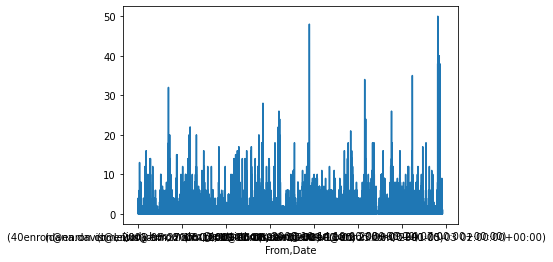

In [111]:
df = df.set_index(pd.DatetimeIndex(df['Date']))
h = df.groupby('From').resample('H').size()
h.plot()

In [113]:
gb_day = h.groupby('Date')

In [118]:
h['Date'].nunique()

KeyError: 'Date'

In [116]:
gb_day.groups

{1998-10-30 15:00:00+00:00: [('mark.taylor@enron.com', 1998-10-30 15:00:00+00:00)], 1998-10-30 16:00:00+00:00: [('mark.taylor@enron.com', 1998-10-30 16:00:00+00:00)], 1998-10-30 17:00:00+00:00: [('mark.taylor@enron.com', 1998-10-30 17:00:00+00:00)], 1998-10-30 18:00:00+00:00: [('mark.taylor@enron.com', 1998-10-30 18:00:00+00:00)], 1998-10-30 19:00:00+00:00: [('mark.taylor@enron.com', 1998-10-30 19:00:00+00:00)], 1998-10-30 20:00:00+00:00: [('mark.taylor@enron.com', 1998-10-30 20:00:00+00:00)], 1998-10-30 21:00:00+00:00: [('mark.taylor@enron.com', 1998-10-30 21:00:00+00:00)], 1998-10-30 22:00:00+00:00: [('mark.taylor@enron.com', 1998-10-30 22:00:00+00:00)], 1998-10-30 23:00:00+00:00: [('mark.taylor@enron.com', 1998-10-30 23:00:00+00:00)], 1998-10-31 00:00:00+00:00: [('mark.taylor@enron.com', 1998-10-31 00:00:00+00:00)], 1998-10-31 01:00:00+00:00: [('mark.taylor@enron.com', 1998-10-31 01:00:00+00:00)], 1998-10-31 02:00:00+00:00: [('mark.taylor@enron.com', 1998-10-31 02:00:00+00:00)], 199

NameError: name 'tokens' is not defined

In [134]:
df1

,Date,index,Content,Message-ID,Date.1,From,To,Subject,Mime-Version,Content-Type,...,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName,emailinterval,wordcount,tokens
1,2001-05-13 14:52:00+00:00,41964,David:\nDo you have a simulation set up that w...,<28095741.1075849632148.JavaMail.evans@thyme>,2001-05-13 14:52:00+00:00,john.arnold@enron.com,david.forster@enron.com,Re:,1.0,text/plain; charset=us-ascii,...,John Arnold,David Forster,NaN,NaN,\John_Arnold_Oct2001\Notes Folders\Sent,ARNOLD-J,jarnold.nsf,<bound method Series.diff of 1 2001-05-13 ...,"{'david': 2, 'do': 1, 'you': 3, 'have': 5, 'a'...","<bound method BaseBlob.tokenize of TextBlob(""D..."
2,2001-02-07 11:09:00+00:00,120047,EB2762 !\n\n\n\nFrom: Saji John@ENRON COMMUNIC...,<8307128.1075848347383.JavaMail.evans@thyme>,2001-02-07 11:09:00+00:00,harry.arora@enron.com,saji.john@enron.com,Re: Meeting on RSL Capacity Auctions,1.0,text/plain; charset=us-ascii,...,Harry Arora,Saji John,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,<bound method Series.diff of 1 2001-05-13 ...,"{'eb2762': 1, 'from': 2, 'saji': 5, 'john': 4,...","<bound method BaseBlob.tokenize of TextBlob(""E..."
3,2001-02-07 10:50:00+00:00,120039,That sounds good.\n\n\nHarry\n\n\n\nFrom: Saji...,<24219499.1075848347361.JavaMail.evans@thyme>,2001-02-07 10:50:00+00:00,harry.arora@enron.com,saji.john@enron.com,Re: Meeting on RSL Capacity Auctions,1.0,text/plain; charset=us-ascii,...,Harry Arora,Saji John,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,<bound method Series.diff of 1 2001-05-13 ...,"{'that': 1, 'sounds': 1, 'good': 1, 'harry': 3...","<bound method BaseBlob.tokenize of TextBlob(""T..."
4,2001-01-22 18:36:00+00:00,120040,Dave\n\nFind enclosed the business plan and th...,<30442669.1075848347294.JavaMail.evans@thyme>,2001-01-22 18:36:00+00:00,harry.arora@enron.com,dave.samuels@enron.com,Business Plan,1.0,text/plain; charset=us-ascii,...,Harry Arora,Dave Samuels,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,<bound method Series.diff of 1 2001-05-13 ...,"{'dave': 1, 'find': 1, 'enclosed': 1, 'the': 2...","<bound method BaseBlob.tokenize of TextBlob(""D..."
5,2001-02-06 15:54:00+00:00,120041,Jocelyn\n\nNew Power Company and Azurix are ot...,<8031186.1075848347339.JavaMail.evans@thyme>,2001-02-06 15:54:00+00:00,harry.arora@enron.com,jocelyn.gordon@enron.com,Re: The Body Shop quick question,1.0,text/plain; charset=us-ascii,...,Harry Arora,Jocelyn Gordon,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,<bound method Series.diff of 1 2001-05-13 ...,"{'jocelyn': 3, 'new': 3, 'power': 3, 'company'...","<bound method BaseBlob.tokenize of TextBlob(""J..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2001-05-07 06:54:00+00:00,34916,---------------------- Forwarded by Phillip K ...,<16876923.1075855713450.JavaMail.evans@thyme>,2001-05-07 06:54:00+00:00,phillip.allen@enron.com,keith.holst@enron.com,California Update 5/4/01,1.0,text/plain; charset=us-ascii,...,Phillip K Allen,Keith Holst,NaN,NaN,\Phillip_Allen_June2001\Notes Folders\Sent,Allen-P,pallen.nsf,<bound method Series.diff of 1 2001-05-13 ...,"{'forwarded': 1, 'by': 9, 'phillip': 2, 'k': 2...","<bound method BaseBlob.tokenize of TextBlob(""-..."
996,2001-02-06 14:12:00+00:00,34915,---------------------- Forwarded by Phillip K ...,<30815432.1075855717138.JavaMail.evans@thyme>,2001-02-06 14:12:00+00:00,phillip.allen@enron.com,mike.grigsby@enron.com,Smeltering,1.0,text/plain; charset=us-ascii,...,Phillip K Allen,Mike Grigsby,NaN,NaN,\Phillip_Allen_June2001\Notes Folders\Sent,Allen-P,pallen.nsf,<bound method Series.diff of 1 2001-05-13 ...,"{'forwarded': 2, 'by': 2, 'phillip': 2, 'k': 2...","<bound method BaseBlob.tokenize of TextBlob(""-..."
997,2000-12-12 12:03:00+00:00,34914,"Christy,\n\n I read these points and they defi...",<19790540.1075855679828.JavaMail.evans@thyme>,2000-12-12 12:03:00+00:00,phillip.allen@enron.com,chr

In [42]:
h

From                        Date                     
40enron@enron.com           2001-07-27 17:00:00+00:00    1
a..howard@enron.com         2001-11-27 12:00:00+00:00    1
a..martin@enron.com         2001-04-17 19:00:00+00:00    1
                            2001-04-17 20:00:00+00:00    0
                            2001-04-17 21:00:00+00:00    0
                                                        ..
zionette.vincent@enron.com  2001-05-03 06:00:00+00:00    0
                            2001-05-03 07:00:00+00:00    0
                            2001-05-03 08:00:00+00:00    0
                            2001-05-03 09:00:00+00:00    0
                            2001-05-03 10:00:00+00:00    1
Length: 1730303, dtype: int64

In [44]:
df.From.nunique()

260

In [40]:
t

From                        Date                     
40enron@enron.com           2001-07-27 00:00:00+00:00    1
a..howard@enron.com         2001-11-27 00:00:00+00:00    1
a..martin@enron.com         2001-04-17 00:00:00+00:00    1
                            2001-04-18 00:00:00+00:00    0
                            2001-04-19 00:00:00+00:00    4
                                                        ..
zionette.vincent@enron.com  2001-04-29 00:00:00+00:00    0
                            2001-04-30 00:00:00+00:00    0
                            2001-05-01 00:00:00+00:00    0
                            2001-05-02 00:00:00+00:00    0
                            2001-05-03 00:00:00+00:00    1
Length: 72328, dtype: int64

In [13]:
gb_from = df.groupby('From')

In [25]:
w = gb_from.resample('D').mean()

In [34]:
w.loc[2]

KeyError: 2

In [60]:
import seaborn as sns

In [69]:
#df.to_csv('sortedemails.csv')

In [65]:
gb_from = df.groupby('From')

In [3]:
import nltk



In [8]:
from textblob import TextBlob
from textblob.sentiments import NaiveBayesAnalyzer
opinion = TextBlob("EliteDataScience.com is dope!", analyzer=NaiveBayesAnalyzer())
opinion.sentiment

Sentiment(classification='neg', p_pos=0.35000000000000003, p_neg=0.6499999999999997)

In [63]:
opinion.tags

[('EliteDataScience.com', 'NNP'), ('is', 'VBZ'), ('dope', 'NN')]

In [152]:
type(opinion.tokens)

textblob.blob.WordList

In [160]:
import numpy as np
X = np.array(opinion.tokens)

In [161]:
X

array(['EliteDataScience.com', 'is', 'dope', '!'], dtype='<U20')

In [9]:
dir(opinion)

['__add__',
 '__class__',
 '__contains__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_cmpkey',
 '_compare',
 '_create_sentence_objects',
 '_strkey',
 'analyzer',
 'classifier',
 'classify',
 'correct',
 'detect_language',
 'ends_with',
 'endswith',
 'find',
 'format',
 'index',
 'join',
 'json',
 'lower',
 'ngrams',
 'noun_phrases',
 'np_counts',
 'np_extractor',
 'parse',
 'parser',
 'polarity',
 'pos_tagger',
 'pos_tags',
 'raw',
 'raw_sentences',
 'replace',
 'rfind',
 'rindex',
 'sentences',
 'sentiment',
 'sentiment_assessments',
 'serialized',
 'split',
 'starts_with',
 'startswith',
 'string',
 'strip',
 'stripped',
 'subjectivi

# Calculate sentiment

In [332]:
from textblob import TextBlob
from textblob.sentiments import NaiveBayesAnalyzer

In [333]:
def sentiment_calc(text):
    try:
        tmp = TextBlob(text, analyzer=NaiveBayesAnalyzer())
        tmp = tmp.sentiment()
        return tmp
    except:
        return None

#df1['sentiment'] = df1['Content'].swifter.apply(sentiment_calc)

In [344]:
t = df1['Content'][1]

s = TextBlob(t)
print(dir(s))

['__add__', '__class__', '__contains__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__iter__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_cmpkey', '_compare', '_create_sentence_objects', '_strkey', 'analyzer', 'classifier', 'classify', 'correct', 'detect_language', 'ends_with', 'endswith', 'find', 'format', 'index', 'join', 'json', 'lower', 'ngrams', 'noun_phrases', 'np_counts', 'np_extractor', 'parse', 'parser', 'polarity', 'pos_tagger', 'pos_tags', 'raw', 'raw_sentences', 'replace', 'rfind', 'rindex', 'sentences', 'sentiment', 'sentiment_assessments', 'serialized', 'split', 'starts_with', 'startswith', 'string', 'strip', 'stripped', 'subjectivity', 'tags', 'title', 'to_json', 'tokenize', 'tokenizer', 'tokens', 'tra

In [362]:
#c = np.sum(df1['Content'].apply(lambda x: x.contains('\?')).values)

questionmark = df.swifter.apply(lambda x: x.astype(str).str.contains('\?')).any(axis=1).sum()

/home/becode/anaconda3/lib/python3.7/site-packages/swifter/swifter.py:37: UserWarning: This pandas object has duplicate indices, and swifter may not be able to improve performance. Consider resetting the indices with `df.reset_index(drop=True)`.
  "This pandas object has duplicate indices, and swifter may not be able to improve performance. Consider resetting the indices with `df.reset_index(drop=True)`."


In [366]:
exclaimmark = df.swifter.apply(lambda x: x.astype(str).str.contains('\!')).any(axis=1).sum()

In [436]:
df[df.Content.apply(lambda x: 'ass' in x)].From.value_counts()

eric.bass@enron.com           2109
vince.kaminski@enron.com      1923
kay.mann@enron.com            1892
jeff.dasovich@enron.com       1609
sally.beck@enron.com           860
                              ... 
skennedy@houston.rr.com          1
brenda.whitehead@enron.com       1
casey.evans@enron.com            1
carol.coats@enron.com            1
eric.linder@enron.com            1
Name: From, Length: 217, dtype: int64

In [2]:
df['hour'] = df.Date.dt.hour

In [3]:
df['day'] = df.Date.dt.day

In [4]:
df['month'] = df.Date.dt.month

In [5]:
df['year'] = df.Date.dt.year

In [6]:
df.dtypes

Date                         datetime64[ns, UTC]
index                                      int64
Content                                   object
Message-ID                                object
Date.1                                    object
From                                      object
To                                        object
Subject                                   object
Mime-Version                             float64
Content-Type                              object
Content-Transfer-Encoding                 object
X-From                                    object
X-To                                      object
X-cc                                      object
X-bcc                                     object
X-Folder                                  object
X-Origin                                  object
X-FileName                                object
hour                                       int64
day                                        int64
month               

In [15]:
df.groupby('hour')['Content'].apply(lambda x: 'ass' in x).sum()

0

In [455]:
len(gb.groups)

11691

In [10]:
gb.apply(lambda x: 'ass' in x).value_counts()

False    11691
dtype: int64

In [467]:
ass = gb.Content.apply(lambda x: "ass" in x)

In [468]:
ass.value_counts()

False    11691
Name: Content, dtype: int64

In [ ]:
gb[df.Content]

In [390]:
suicide.Content.value_counts()

---------------------- Forwarded by Judy Hernandez/HOU/ECT on 07/13/2000=20\n02:36 PM ---------------------------\n\n\nMaria Sandoval\n07/13/2000 01:50 PM\nTo: Chantelle Villanueva/HOU/ECT@ECT, Elizabeth Soto/HOU/ECT@ECT, Melissa=\n=20\nRodriguez/HOU/ECT@ECT, Judy Hernandez/HOU/ECT@ECT, Andrea R=20\nGuillen/HOU/ECT@ECT, Pamela Sonnier/HOU/ECT@ECT\ncc: =20\nSubject: Fwd: Why ladies are the best!\n\n\n---------------------- Forwarded by Maria Sandoval/HOU/ECT on 07/13/2000=20\n01:49 PM ---------------------------\nFrom: Brenda Barreda@ENRON_DEVELOPMENT on 07/12/2000 02:43 PM\nTo: MY BUDDIES, Iracema Hernandez/Corp/Enron@ENRON\ncc: =20\nSubject: Fwd: Why ladies are the best!\n\n\n---------------------- Forwarded by Brenda Barreda/ENRON_DEVELOPMENT on=20\n07/12/2000 02:42 PM ---------------------------\n\n\nSara Carrizal <scarrizal_99@yahoo.com> on 07/12/2000 02:39:26 PM\nTo: Martha Arriola <marriola@yorkgrp.com>, sherita_scott@enron.net,=20\nlnmarino@email.msn.com\ncc: =20\n\nSubject: Fwd

In [64]:
df[df.Content.apply(lambda x: "?" in x)].From.value_counts()

kay.mann@enron.com           4459
vince.kaminski@enron.com     2898
jeff.dasovich@enron.com      2554
chris.germany@enron.com      2192
sara.shackleton@enron.com    2091
                             ... 
m..smith@enron.com              1
rjbaker@ttu.edu                 1
j.harris@enron.com              1
cheryl.johnson@enron.com        1
brian.hoskins@enron.com         1
Name: From, Length: 218, dtype: int64

In [26]:
questions

chris.germany@enron.com     286
drew.fossum@enron.com       142
jeff.dasovich@enron.com     110
kay.mann@enron.com           96
vince.kaminski@enron.com     95
                           ... 
jason.wolfe@enron.com         1
greg.whalley@enron.com        1
b..sanders@enron.com          1
no.address@enron.com          1
cara.semperger@enron.com      1
Name: From, Length: 140, dtype: int64

In [377]:

q = questions.resample('D').size()

<AxesSubplot:xlabel='Date'>

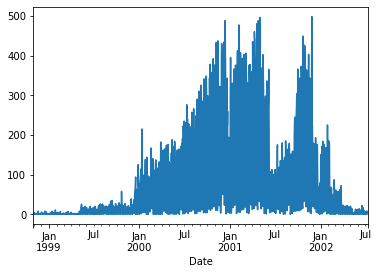

In [379]:
df.resample('D').size().plot()

<AxesSubplot:xlabel='Date'>

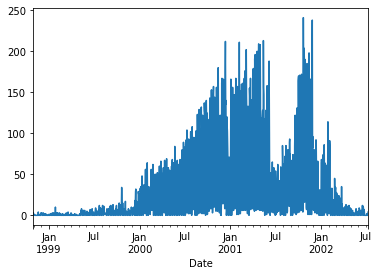

In [378]:
q.plot()

In [162]:
def tokens(text):
    try:
        return TextBlob(text).tokens
    except:
        return None

df1['tokens'] = df1['Content'].apply(tokens)

/home/becode/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


# Convert content to string, vectorize and make array

In [292]:
from sklearn.feature_extraction.text import TfidfVectorizer
v = TfidfVectorizer()
x = v.fit_transform(df1['Content'].astype('string'))

In [227]:
def tokens(text):
    try:
        return TextBlob(text).tokens
    except:
        return None

x = df1['Content'].apply(tokens)


In [224]:
def vectorize(text):
    X=[]
    try:
        vectorizer = TfidfVectorizer(stop_words='english')
        x = vectorizer.fit_transform(x)
        #X.append(x)
        return text
    except:
        return None

In [225]:
df1['tokens'].swifter.apply(vectorize)

[<1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x342 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x342 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x342 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x342 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x342 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x342 sparse matrix of type '<class 'numpy.float64'>'
	with 3 stored elements in Compressed Sparse Row format>, <1x342 sparse matrix of type '<class 'numpy.float64'>'
	with 2 stored elements in Compressed Sparse Row format>, <1x342 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x342 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x14 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x14 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x14 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x14 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x14 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x14 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x14 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x14 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x14 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x36 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x36 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x36 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x36 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x36 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x36 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x36 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x36 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x36 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x99 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x99 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x99 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x99 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x99 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x99 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x99 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x99 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x99 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x221 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x221 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x221 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x221 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x221 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x221 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x221 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x221 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x221 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x55 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x55 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x55 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x55 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x55 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x55 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x55 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x55 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x55 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, 

[<1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row 

[<1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[<1x118 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x118 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x118 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x118 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x118 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x118 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x118 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x118 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x118 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x253 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x15 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x15 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x15 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x15 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x15 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x15 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x15 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x15 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x15 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x288 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x288 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x288 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x288 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x288 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x288 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x288 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x288 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x288 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x176 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x176 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x176 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x176 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x176 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x176 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x176 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x176 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x176 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sp

[<1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x375 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x375 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x375 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x375 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x375 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x375 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x375 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x375 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x375 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x106 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x106 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x106 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x106 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x106 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x106 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x106 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x106 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x106 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[<1x117 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x117 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x117 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x117 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x117 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x117 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x117 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x117 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x117 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x96 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x96 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x96 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x96 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x96 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x96 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x96 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x96 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x96 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row 

[<1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row 

[<1x115 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x115 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x115 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x115 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x115 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x115 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x115 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x115 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x115 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x6 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x6 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x6 sparse matrix of type '<class 'numpy.float64'>'
	with 5 stored elements in Compressed Sparse Row format>]
[<1x51 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x51 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x51 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x51 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x51 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x51 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row fo

[<1x102 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x102 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x102 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x102 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x102 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x102 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x102 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x102 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x102 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x9 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, 

[<1x62 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x62 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x62 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x62 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x62 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x62 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x62 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x62 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x62 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x786 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x786 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x786 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x786 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x786 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x786 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x786 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x786 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x786 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x301 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[<1x116 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x116 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x116 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x116 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x116 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x116 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x116 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x116 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x116 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x170 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x170 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x170 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x170 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x170 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x170 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x170 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x170 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x170 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x261 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x261 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x261 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x261 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x261 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x261 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x261 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x261 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x261 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x54 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x54 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x54 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x54 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x54 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x54 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x54 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x54 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x54 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x167 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x167 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x167 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x167 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x167 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x167 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x167 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x167 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x167 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x509 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x509 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x509 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x509 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x509 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x509 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x509 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x509 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x509 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x10 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x10 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x10 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x10 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x10 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x10 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x10 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x10 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x10 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row 

[<1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x76 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x2 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x2 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x2 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x2 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x2 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x2 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x2 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>]
[<1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>,

[<1x11 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x11 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x11 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x11 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x11 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x11 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x11 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x11 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x11 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x326 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x326 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x326 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x326 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x326 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x326 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x326 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x326 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x326 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x29 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[<1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x70 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x103 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x103 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x103 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x103 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x103 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x103 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x103 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x103 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x103 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x279 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x279 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x279 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x279 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x279 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x279 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x279 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x279 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x279 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x298 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x298 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x298 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x298 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x298 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x298 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x298 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x298 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x298 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x59 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x420 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x420 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x420 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x420 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x420 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x420 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x420 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x420 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x420 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x52 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x26 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x49 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x49 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x49 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x49 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x49 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x49 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x49 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x49 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x49 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row 

[<1x136 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x136 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x136 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x136 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x136 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x136 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x136 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x136 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x136 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x28 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x28 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x28 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x28 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x28 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x28 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x28 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x28 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x28 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[<1x131 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x131 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x131 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x131 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x131 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x131 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x131 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x131 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x131 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x21 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x21 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x21 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x21 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x21 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x21 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x21 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x21 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x21 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x37 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x37 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x37 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x37 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x37 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x37 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x37 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x37 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x37 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x79 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x79 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x79 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x79 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x79 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x79 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x79 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x79 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x79 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x7 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, 

[<1x61 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x61 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x61 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x61 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x61 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x61 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x61 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x61 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x61 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x300 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sp

[<1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x77 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row 

[<1x66 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x66 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x66 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x66 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x66 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x66 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>, <1x66 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x66 sparse matrix of type '<class 'numpy.float64'>'
	with 0 stored elements in Compressed Sparse Row format>, <1x66 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row 

1      None
2      None
3      None
4      None
5      None
       ... 
995    None
996    None
997    None
998    None
999    None
Name: tokens, Length: 999, dtype: object

# Clustering tokens

In [272]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
import numpy as np

#Convert content to string
df1['str'] = df1['Content'].apply(lambda x : str(x))

#Convert content to word vector
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(df1['str'])

#Run clustering
#clustering = DBSCAN(eps=2, min_samples=2).fit(X)
clustering = KMeans(n_clusters=3, random_state=0).fit(X)
clustering.labels_

/home/becode/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


array([0, 2, 2, 0, 2, 0, 2, 0, 2, 0, 1, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 1, 2, 0, 0, 1, 0, 0, 2, 2, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       2, 0, 0, 0, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 1, 2, 0, 0, 0, 0, 0, 2, 1, 0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 2, 0, 1, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 2, 0, 2, 2, 0,
       0, 0, 0, 2, 2, 2, 0, 0, 2, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 2, 0, 1, 0, 0, 1, 2, 1, 2, 0, 1, 0, 0, 2, 1, 0, 0, 0, 0, 2, 0,
       0, 2, 0, 0, 0, 2, 0, 1, 2, 2, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 2,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 2, 2, 0, 0, 0, 0, 1, 0, 2, 2, 2,
       2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 0, 0,
       0, 1, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2,
       2, 0, 2, 1, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2,

In [273]:
from sklearn import metrics
core_samples_mask = np.zeros_like(clustering.labels_, dtype=bool)
core_samples_mask[clustering.core_sample_indices_]=True
labels = clustering.labels_

AttributeError: 'KMeans' object has no attribute 'core_sample_indices_'

In [274]:
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels))

Estimated number of clusters: 1
Estimated number of noise points: 0


ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

ValueError: setting an array element with a sequence.

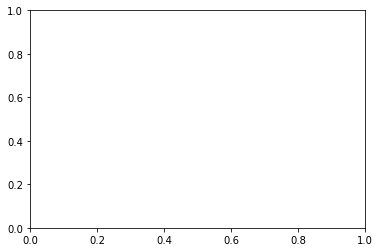

In [266]:
# Plot result
import matplotlib.pyplot as plt

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=14)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()


In [247]:
clustering.labels_

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [76]:
names = df['X-From'].value_counts()

# Gensim

In [275]:
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [276]:
import io
import os.path
import re
import tarfile

import smart_open

def extract_documents(url='https://cs.nyu.edu/~roweis/data/nips12raw_str602.tgz'):
    fname = url.split('/')[-1]

    # Download the file to local storage first.
    # We can't read it on the fly because of
    # https://github.com/RaRe-Technologies/smart_open/issues/331
    if not os.path.isfile(fname):
        with smart_open.open(url, "rb") as fin:
            with smart_open.open(fname, 'wb') as fout:
                while True:
                    buf = fin.read(io.DEFAULT_BUFFER_SIZE)
                    if not buf:
                        break
                    fout.write(buf)

    with tarfile.open(fname, mode='r:gz') as tar:
        # Ignore directory entries, as well as files like README, etc.
        files = [
            m for m in tar.getmembers()
            if m.isfile() and re.search(r'nipstxt/nips\d+/\d+\.txt', m.name)
        ]
        for member in sorted(files, key=lambda x: x.name):
            member_bytes = tar.extractfile(member).read()
            yield member_bytes.decode('utf-8', errors='replace')

docs = list(extract_documents())

In [277]:
# Tokenize the documents.
from nltk.tokenize import RegexpTokenizer

# Split the documents into tokens.
tokenizer = RegexpTokenizer(r'\w+')
for idx in range(len(docs)):
    docs[idx] = docs[idx].lower()  # Convert to lowercase.
    docs[idx] = tokenizer.tokenize(docs[idx])  # Split into words.

# Remove numbers, but not words that contain numbers.
docs = [[token for token in doc if not token.isnumeric()] for doc in docs]

# Remove words that are only one character.
docs = [[token for token in doc if len(token) > 1] for doc in docs]

In [278]:
# Lemmatize the documents.
from nltk.stem.wordnet import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()
docs = [[lemmatizer.lemmatize(token) for token in doc] for doc in docs]

In [279]:
# Compute bigrams.
from gensim.models import Phrases

# Add bigrams and trigrams to docs (only ones that appear 20 times or more).
bigram = Phrases(docs, min_count=20)
for idx in range(len(docs)):
    for token in bigram[docs[idx]]:
        if '_' in token:
            # Token is a bigram, add to document.
            docs[idx].append(token)

2020-09-22 13:29:52,022 : INFO : collecting all words and their counts
2020-09-22 13:29:52,023 : INFO : PROGRESS: at sentence #0, processed 0 words and 0 word types
2020-09-22 13:30:00,819 : INFO : collected 1120198 word types from a corpus of 4629808 words (unigram + bigrams) and 1740 sentences
2020-09-22 13:30:00,819 : INFO : using 1120198 counts as vocab in Phrases<0 vocab, min_count=20, threshold=10.0, max_vocab_size=40000000>


In [281]:
# Remove rare and common tokens.
from gensim.corpora import Dictionary

# Create a dictionary representation of the documents.
dictionary = Dictionary(docs)

# Filter out words that occur less than 20 documents, or more than 50% of the documents.
dictionary.filter_extremes(no_below=20, no_above=0.5)


2020-09-22 13:56:04,280 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2020-09-22 13:56:08,463 : INFO : built Dictionary(79429 unique tokens: ['0a', '2h', '2h2', '2he', '2n']...) from 1740 documents (total 4953968 corpus positions)
2020-09-22 13:56:08,653 : INFO : discarding 70785 tokens: [('0a', 19), ('2h', 16), ('2h2', 1), ('2he', 3), ('__c', 2), ('_k', 6), ('a', 1740), ('about', 1058), ('abstract', 1740), ('after', 1087)]...
2020-09-22 13:56:08,653 : INFO : keeping 8644 tokens which were in no less than 20 and no more than 870 (=50.0%) documents
2020-09-22 13:56:08,719 : INFO : resulting dictionary: Dictionary(8644 unique tokens: ['2n', '_c', 'a2', 'a_follows', 'ability']...)


In [282]:
# Bag-of-words representation of the documents.
corpus = [dictionary.doc2bow(doc) for doc in docs]

In [283]:
print('Number of unique tokens: %d' % len(dictionary))
print('Number of documents: %d' % len(corpus))

Number of unique tokens: 8644
Number of documents: 1740


In [284]:
from gensim.models import LdaModel

# Set training parameters.
num_topics = 10
chunksize = 2000
passes = 20
iterations = 400
eval_every = None  # Don't evaluate model perplexity, takes too much time.

# Make a index to word dictionary.
temp = dictionary[0]  # This is only to "load" the dictionary.
id2word = dictionary.id2token

model = LdaModel(
    corpus=corpus,
    id2word=id2word,
    chunksize=chunksize,
    alpha='auto',
    eta='auto',
    iterations=iterations,
    num_topics=num_topics,
    passes=passes,
    eval_every=eval_every
)

2020-09-22 13:56:39,130 : INFO : using autotuned alpha, starting with [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]
2020-09-22 13:56:39,132 : INFO : using serial LDA version on this node
2020-09-22 13:56:39,145 : INFO : running online (multi-pass) LDA training, 10 topics, 20 passes over the supplied corpus of 1740 documents, updating model once every 1740 documents, evaluating perplexity every 0 documents, iterating 400x with a convergence threshold of 0.001000
2020-09-22 13:56:39,146 : INFO : PROGRESS: pass 0, at document #1740/1740
2020-09-22 13:56:58,093 : INFO : optimized alpha [0.083667815, 0.07389529, 0.07926364, 0.08787654, 0.088102765, 0.06665744, 0.07291396, 0.07966816, 0.059663523, 0.08665159]
2020-09-22 13:56:58,106 : INFO : topic #8 (0.060): 0.006*"layer" + 0.006*"neuron" + 0.004*"threshold" + 0.004*"image" + 0.003*"matrix" + 0.003*"spike" + 0.002*"noise" + 0.002*"response" + 0.002*"recognition" + 0.002*"class"
2020-09-22 13:56:58,108 : INFO : topic #5 (0.067): 0.005*"

2020-09-22 13:57:39,789 : INFO : topic #5 (0.054): 0.005*"gradient" + 0.005*"action" + 0.005*"optimal" + 0.004*"policy" + 0.004*"rule" + 0.004*"approximation" + 0.004*"convergence" + 0.004*"bound" + 0.003*"matrix" + 0.003*"let"
2020-09-22 13:57:39,790 : INFO : topic #3 (0.054): 0.008*"speech" + 0.007*"recognition" + 0.007*"word" + 0.006*"hidden" + 0.006*"layer" + 0.005*"signal" + 0.004*"class" + 0.004*"prediction" + 0.004*"noise" + 0.004*"classification"
2020-09-22 13:57:39,792 : INFO : topic #0 (0.057): 0.007*"gaussian" + 0.006*"mixture" + 0.005*"class" + 0.005*"prior" + 0.005*"density" + 0.004*"bayesian" + 0.004*"sample" + 0.004*"hidden" + 0.004*"likelihood" + 0.004*"component"
2020-09-22 13:57:39,793 : INFO : topic diff=0.206677, rho=0.377964
2020-09-22 13:57:39,805 : INFO : PROGRESS: pass 6, at document #1740/1740
2020-09-22 13:57:45,903 : INFO : optimized alpha [0.055942114, 0.038640026, 0.04733744, 0.052322023, 0.0433251, 0.053898327, 0.042952746, 0.04422782, 0.03457728, 0.045318

2020-09-22 13:58:13,827 : INFO : topic #8 (0.035): 0.010*"bound" + 0.008*"threshold" + 0.008*"theorem" + 0.008*"class" + 0.007*"let" + 0.006*"layer" + 0.006*"dimension" + 0.005*"polynomial" + 0.005*"proof" + 0.005*"node"
2020-09-22 13:58:13,828 : INFO : topic #1 (0.035): 0.018*"control" + 0.007*"controller" + 0.007*"trajectory" + 0.007*"robot" + 0.007*"motor" + 0.006*"dynamic" + 0.006*"movement" + 0.006*"position" + 0.005*"reinforcement" + 0.005*"action"
2020-09-22 13:58:13,829 : INFO : topic #3 (0.049): 0.011*"speech" + 0.010*"recognition" + 0.009*"word" + 0.006*"signal" + 0.005*"class" + 0.005*"hidden" + 0.005*"layer" + 0.005*"classification" + 0.005*"classifier" + 0.004*"prediction"
2020-09-22 13:58:13,831 : INFO : topic #5 (0.054): 0.007*"optimal" + 0.006*"gradient" + 0.006*"action" + 0.005*"policy" + 0.005*"convergence" + 0.004*"approximation" + 0.004*"matrix" + 0.004*"rule" + 0.004*"stochastic" + 0.004*"machine"
2020-09-22 13:58:13,832 : INFO : topic #0 (0.058): 0.007*"gaussian" 

2020-09-22 13:58:39,716 : INFO : topic #0 (0.062): 0.007*"gaussian" + 0.006*"mixture" + 0.006*"density" + 0.005*"prior" + 0.005*"likelihood" + 0.005*"estimate" + 0.005*"bayesian" + 0.004*"class" + 0.004*"sample" + 0.004*"variance"
2020-09-22 13:58:39,717 : INFO : topic diff=0.116088, rho=0.235702
2020-09-22 13:58:39,729 : INFO : PROGRESS: pass 17, at document #1740/1740
2020-09-22 13:58:44,625 : INFO : optimized alpha [0.06289661, 0.035079706, 0.04497602, 0.04960965, 0.037438873, 0.056776006, 0.041859098, 0.041918717, 0.038327422, 0.053869024]
2020-09-22 13:58:44,634 : INFO : topic #1 (0.035): 0.018*"control" + 0.007*"controller" + 0.007*"robot" + 0.007*"trajectory" + 0.007*"motor" + 0.006*"dynamic" + 0.006*"movement" + 0.006*"action" + 0.006*"position" + 0.005*"reinforcement"
2020-09-22 13:58:44,636 : INFO : topic #4 (0.037): 0.012*"circuit" + 0.011*"chip" + 0.009*"analog" + 0.007*"voltage" + 0.005*"vlsi" + 0.005*"noise" + 0.004*"energy" + 0.004*"field" + 0.004*"implementation" + 0.00

In [285]:
top_topics = model.top_topics(corpus) #, num_words=20)

# Average topic coherence is the sum of topic coherences of all topics, divided by the number of topics.
avg_topic_coherence = sum([t[1] for t in top_topics]) / num_topics
print('Average topic coherence: %.4f.' % avg_topic_coherence)

from pprint import pprint
pprint(top_topics)

2020-09-22 13:59:24,129 : INFO : CorpusAccumulator accumulated stats from 1000 documents


Average topic coherence: -1.1552.
[([(0.007711163, 'optimal'),
   (0.0074127084, 'gradient'),
   (0.0061004884, 'policy'),
   (0.0057601985, 'convergence'),
   (0.0055595604, 'action'),
   (0.0043733637, 'matrix'),
   (0.004308056, 'stochastic'),
   (0.004149107, 'approximation'),
   (0.0038148602, 'update'),
   (0.0038092658, 'solution'),
   (0.0037457831, 'iteration'),
   (0.003617498, 'machine'),
   (0.0034456647, 'loss'),
   (0.0034052858, 'dynamic'),
   (0.0033880842, 'rule'),
   (0.003370238, 'decision'),
   (0.0032243943, 'let'),
   (0.003145698, 'cost'),
   (0.0031240557, 'condition'),
   (0.0029646156, 'descent')],
  -0.9604863515859713),
 ([(0.0074445438, 'gaussian'),
   (0.006309146, 'mixture'),
   (0.0056891115, 'density'),
   (0.005049792, 'prior'),
   (0.0049755825, 'likelihood'),
   (0.0048984103, 'estimate'),
   (0.0044881203, 'bayesian'),
   (0.0044077975, 'variance'),
   (0.0043828352, 'component'),
   (0.0043625, 'sample'),
   (0.0042101485, 'class'),
   (0.004139602

In [ ]:
# Clustering with bag of words

In [293]:
# Generating bag of words features.
from sklearn.feature_extraction.text import CountVectorizer
count_vect = CountVectorizer()
bow = count_vect.fit_transform(df1['Content'].values)
bow.shape

(999, 9291)

In [302]:
terms = count_vect.get_feature_names()
#terms[1:100]

In [312]:
from sklearn.cluster import KMeans
model = KMeans(n_clusters = 10,init='k-means++', n_jobs = -1,random_state=99)
model.fit(bow)

KMeans(n_clusters=10, n_jobs=-1, random_state=99)

In [313]:
labels = model.labels_
cluster_center=model.cluster_centers_

In [316]:
model.n_clusters

10

In [317]:
model.cluster_centers_

array([[8.39793282e-02, 7.23514212e-02, 0.00000000e+00, ...,
        0.00000000e+00, 9.04392765e-03, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.00000000e-01, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [3.76543210e-01, 6.72839506e-01, 1.23456790e-02, ...,
        6.17283951e-03, 0.00000000e+00, 6.17283951e-03],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 2.10000000e+01, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [315]:
dir(model)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_check_n_features',
 '_check_test_data',
 '_estimator_type',
 '_get_param_names',
 '_get_tags',
 '_more_tags',
 '_n_threads',
 '_repr_html_',
 '_repr_html_inner',
 '_repr_mimebundle_',
 '_transform',
 '_validate_data',
 'algorithm',
 'cluster_centers_',
 'copy_x',
 'fit',
 'fit_predict',
 'fit_transform',
 'get_params',
 'inertia_',
 'init',
 'labels_',
 'max_iter',
 'n_clusters',
 'n_features_in_',
 'n_init',
 'n_iter_',
 'n_jobs',
 'precompute_distances',
 'predict',
 'random_state',
 'score',
 'set_params',
 'tol',
 'transform',
 'verbose']

In [299]:
cluster_center

array([[8.39793282e-02, 7.23514212e-02, 0.00000000e+00, ...,
        0.00000000e+00, 9.04392765e-03, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [2.00000000e-01, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [3.76543210e-01, 6.72839506e-01, 1.23456790e-02, ...,
        6.17283951e-03, 0.00000000e+00, 6.17283951e-03],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 2.10000000e+01, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [300]:
from sklearn import metrics
silhouette_score = metrics.silhouette_score(bow, labels, metric='euclidean')

In [301]:
silhouette_score

0.45448696115514653

In [303]:
# Giving Labels/assigning a cluster to each point/text 
df2 = df1
df2['Bow Clus Label'] = model.labels_ # the last column you can see the label numebers
df2.head(2)

/home/becode/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,Date,index,Content,Message-ID,Date.1,From,To,Subject,Mime-Version,Content-Type,...,X-bcc,X-Folder,X-Origin,X-FileName,emailinterval,wordcount,tokens,str,sentiment,Bow Clus Label
1,2001-05-13 14:52:00+00:00,41964,David:\nDo you have a simulation set up that w...,<28095741.1075849632148.JavaMail.evans@thyme>,2001-05-13 14:52:00+00:00,john.arnold@enron.com,david.forster@enron.com,Re:,1.0,text/plain; charset=us-ascii,...,NaN,\John_Arnold_Oct2001\Notes Folders\Sent,ARNOLD-J,jarnold.nsf,<bound method Series.diff of 1 2001-05-13 ...,"{'david': 2, 'do': 1, 'you': 3, 'have': 5, 'a'...","[David, :, Do, you, have, a, simulation, set, ...",David:\nDo you have a simulation set up that w...,"(-0.037886977886977896, 0.41929565929565926)",3
2,2001-02-07 11:09:00+00:00,120047,EB2762 !\n\n\n\nFrom: Saji John@ENRON COMMUNIC...,<8307128.1075848347383.JavaMail.evans@thyme>,2001-02-07 11:09:00+00:00,harry.arora@enron.com,saji.john@enron.com,Re: Meeting on RSL Capacity Auctions,1.0,text/plain; charset=us-ascii,...,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,<bound method Series.diff of 1 2001-05-13 ...,"{'eb2762': 1, 'from': 2, 'saji': 5, 'john': 4,...","[EB2762, !, From, :, Saji, John, @, ENRON, COM...",EB2762 !\n\n\n\nFrom: Saji John@ENRON COMMUNIC...,"(0.14285714285714285, 0.3428571428571429)",0


In [306]:
# How many points belong to each cluster -> using group by in pandas
df2.groupby(['Bow Clus Label'])['Content'].count()

Bow Clus Label
0    774
1      2
2     10
3     25
4     18
5      1
6      3
7    162
8      1
9      3
Name: Content, dtype: int64

In [307]:
print("Top terms per cluster:")
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = count_vect.get_feature_names()
for i in range(10):
    print("Cluster %d:" % i, end='')
    for ind in order_centroids[i, :10]:
        print(' %s' % terms[ind], end='')
        print()

Top terms per cluster:
Cluster 0: the
 to
 phillip
 ect
 you
 on
 and
 is
 hou
 for
Cluster 1: ect
 hou
 enron
 corp
 to
 the
 na
 and
 is
 this
Cluster 2: enron
 ect
 na
 corp
 hou
 to
 hr
 you
 your
 the
Cluster 3: the
 to
 of
 and
 in
 for
 ect
 is
 09
 that
Cluster 4: ect
 hou
 enron
 ees
 the
 on
 allen
 phillip
 2000
 pdx
Cluster 5: ect
 enron
 hou
 enronxgate
 corp
 enron_development
 the
 na
 john
 will
Cluster 6: ees
 hou
 com
 enron
 ect
 20
 mail
 the
 of
 to
Cluster 7: the
 to
 and
 of
 you
 on
 is
 for
 enron
 com
Cluster 8: the
 3d
 enron
 com
 provide
 to
 or
 09the
 and
 of
Cluster 9: the
 of
 to
 and
 for
 is
 000
 be
 are
 as


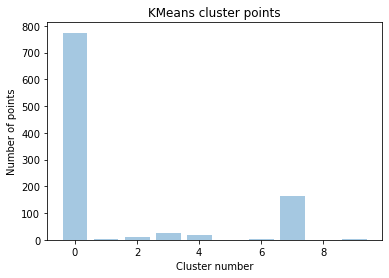

In [308]:
# visually how points or reviews are distributed across 10 clusters 
import matplotlib.pyplot as plt
plt.bar([x for x in range(10)], df2.groupby(['Bow Clus Label'])['Content'].count(), alpha = 0.4)
plt.title('KMeans cluster points')
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

In [309]:
for i in range(10):
    print("A review of assigned to cluster ", i)
    print("-" * 70)
    print(df2.iloc[df2.groupby(['Bow Clus Label']).groups[i][0]]['Content'])
    print('\n')
    print("_" * 70)

A review of assigned to cluster  0
----------------------------------------------------------------------
That sounds good.


Harry



From: Saji John@ENRON COMMUNICATIONS on 02/07/2001 10:39 AM
To: Harry Arora/HOU/ECT@ECT
cc:  

Subject: Meeting on RSL Capacity Auctions

Harry,

How about meeting today between 2:00PM and 3:00PM.

Thanks

Saji John


______________________________________________________________________
A review of assigned to cluster  1
----------------------------------------------------------------------
Richard,

 Are you available at 5:30 ET today?

Phillip


______________________________________________________________________
A review of assigned to cluster  2
----------------------------------------------------------------------
---------------------- Forwarded by Phillip K Allen/HOU/ECT on 02/11/2000 
12:31 PM ---------------------------


"George Rahal" <george.rahal@acnpower.com> on 02/07/2000 03:13:58 PM
To: <Phillip_K_Allen@enron.com>
cc:  
Subject: RE: W

In [78]:
names[100:200]

Larry F Campbell                                                297
Sandra F Brawner                                                293
Grigsby, Mike </O=ENRON/OU=NA/CN=RECIPIENTS/CN=MGRIGSB>         292
Mckay, Jonathan </O=ENRON/OU=NA/CN=RECIPIENTS/CN=JMCKAY1>       292
Kim Ward                                                        275
                                                               ... 
Fischer, Mary </O=ENRON/OU=NA/CN=RECIPIENTS/CN=MFISCHER>         58
Sanchez, Monique </O=ENRON/OU=NA/CN=RECIPIENTS/CN=MSANCH2>       57
Reitmeyer, Jay </O=ENRON/OU=NA/CN=RECIPIENTS/CN=JREITME>         57
Brawner, Sandra F. </O=ENRON/OU=NA/CN=RECIPIENTS/CN=SBRAWNE>     54
Beverly Stephens                                                 54
Name: X-From, Length: 100, dtype: int64

In [57]:
# Check for profanity

from profanityfilter import ProfanityFilter

pf = ProfanityFilter()

df1['profanity'] = df1['Content'].apply(lambda x : pf.is_profane(x))

/home/becode/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [64]:
df1 = df[1:1000]

In [70]:
df1['emailinterval'] = df1['Date'].diff

df['donationinterval'] = df.groupby('donorID',  as_index=False)['date'].diff()"

/home/becode/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [73]:
df1.emailinterval[1]

<bound method Series.diff of 1     2001-05-13 14:52:00+00:00
2     2001-02-07 11:09:00+00:00
3     2001-02-07 10:50:00+00:00
4     2001-01-22 18:36:00+00:00
5     2001-02-06 15:54:00+00:00
                 ...           
995   2001-05-07 06:54:00+00:00
996   2001-02-06 14:12:00+00:00
997   2000-12-12 12:03:00+00:00
998   2000-12-18 13:31:00+00:00
999   2000-09-20 15:06:00+00:00
Name: Date, Length: 999, dtype: datetime64[ns, UTC]>

In [52]:


pf.is_clean(x)

NameError: name 'x' is not defined

In [24]:
df1

,Date,index,Content,Message-ID,Date.1,From,To,Subject,Mime-Version,Content-Type,Content-Transfer-Encoding,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName,sentiment
1,2001-05-13 14:52:00+00:00,41964,David:\nDo you have a simulation set up that w...,<28095741.1075849632148.JavaMail.evans@thyme>,2001-05-13 14:52:00+00:00,john.arnold@enron.com,david.forster@enron.com,Re:,1.0,text/plain; charset=us-ascii,7bit,John Arnold,David Forster,NaN,NaN,\John_Arnold_Oct2001\Notes Folders\Sent,ARNOLD-J,jarnold.nsf,"(-0.037886977886977896, 0.41929565929565926)"
2,2001-02-07 11:09:00+00:00,120047,EB2762 !\n\n\n\nFrom: Saji John@ENRON COMMUNIC...,<8307128.1075848347383.JavaMail.evans@thyme>,2001-02-07 11:09:00+00:00,harry.arora@enron.com,saji.john@enron.com,Re: Meeting on RSL Capacity Auctions,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,Saji John,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,"(0.14285714285714285, 0.3428571428571429)"
3,2001-02-07 10:50:00+00:00,120039,That sounds good.\n\n\nHarry\n\n\n\nFrom: Saji...,<24219499.1075848347361.JavaMail.evans@thyme>,2001-02-07 10:50:00+00:00,harry.arora@enron.com,saji.john@enron.com,Re: Meeting on RSL Capacity Auctions,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,Saji John,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,"(0.24444444444444446, 0.37777777777777777)"
4,2001-01-22 18:36:00+00:00,120040,Dave\n\nFind enclosed the business plan and th...,<30442669.1075848347294.JavaMail.evans@thyme>,2001-01-22 18:36:00+00:00,harry.arora@enron.com,dave.samuels@enron.com,Business Plan,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,Dave Samuels,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,"(0.4, 0.8)"
5,2001-02-06 15:54:00+00:00,120041,Jocelyn\n\nNew Power Company and Azurix are ot...,<8031186.1075848347339.JavaMail.evans@thyme>,2001-02-06 15:54:00+00:00,harry.arora@enron.com,jocelyn.gordon@enron.com,Re: The Body Shop quick question,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,Jocelyn Gordon,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,"(0.10921717171717171, 0.5184223184223183)"
6,2001-01-05 16:24:00+00:00,120042,"Suresh\n\nFor the next two weeks, I'd like you...",<22378087.1075848347271.JavaMail.evans@thyme>,2001-01-05 16:24:00+00:00,harry.arora@enron.com,suresh.raghavan@enron.com,Tasks,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,Suresh Raghavan,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,"(0.12916666666666665, 0.22916666666666666)"
7,2001-02-07 15:50:00+00:00,120043,Cool !\n\n\n\n \n\t\n\t\n\tFrom: Jeff Bartl...,<31476896.1075848347405.JavaMail.evans@thyme>,2001-02-07 15:50:00+00:00,harry.arora@enron.com,jeff.bartlett@enron.com,Re: Enron Flat Panel Procurement,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,Jeff Bartlett,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,"(0.09499601275917065, 0.4632509303561935)"
8,2001-02-07 17:52:00+00:00,120044,Rob\n\n\nFind enclosed the business plan and t...,<13027961.1075848347427.JavaMail.evans@thyme>,2001-02-07 17:52:00+00:00,harry.arora@enron.com,robert.saltiel@enron.com,Business Plan,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,Robert Saltiel,NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,"(0.4, 0.8)"
9,2001-02-06 11:26:00+00:00,120045,How does 3 pm look ?\n\n\n\n\n\n\n\nLeonardo P...,<11959247.1075848347316.JavaMail.evans@thyme>,2001-02-06 11:26:00+00:00,harry.arora@enron.com,"leonardo.pacheco@enron.com, carlos.alatorre@en...",Re: TSS Presentation,1.0,text/plain; charset=us-ascii,7bit,Harry Arora,"Leonardo Pacheco, Carlos Alatorre",NaN,NaN,\Harpreet_Arora_Nov2001\Notes Folders\Sent,ARORA-H,harora.nsf,"(0.11111111111111112, 0.4777777777777777)"


In [64]:

sns.lineplot(data=q, x = 'Date', y='From' )

ValueError: Could not interpret value `From` for parameter `y`

In [82]:
from sklearn.pipeline import Pipeline
from gensim.models.doc2vec import TaggedDocument, Doc2Vec
from sklearn.base import BaseEstimator
from gensim.parsing.preprocessing import preprocess_string
from sklearn import utils
from tqdm import tqdm
class Doc2VecTransformer(BaseEstimator):

    def __init__(self, vector_size=100, learning_rate=0.02, epochs=20):
        self.learning_rate = learning_rate
        self.epochs = epochs
        self._model = None
        self.vector_size = vector_size
        self.workers = 1
        #multiprocessing.cpu_count() - 1
    def fit(self, x, y=None):
        tagged_x = [TaggedDocument(preprocess_string(item), [index]) for index, item in enumerate(x)]
        model = Doc2Vec(documents=tagged_x, vector_size=self.vector_size, workers=self.workers)
        for epoch in range(self.epochs):
            model.train(utils.shuffle([x for x in tqdm(tagged_x)]), total_examples=len(tagged_x), epochs=1)
            model.alpha -= self.learning_rate
            model.min_alpha = model.alpha
            self._model = model
        return self

    def transform(self, x):
        arr = np.array([self._model.infer_vector(preprocess_string(item))
        for index, item in enumerate(x)])
        return arr



In [77]:
mail = df.Content

In [80]:
mail = list(mail)

In [87]:
mail = mail[1:100]

In [88]:
from sklearn.pipeline import Pipeline

#tweets_dict = _read_all_health_tweets()
#tweets = tweets_dict.values()

pl = Pipeline(steps=[('doc2vec', Doc2VecTransformer())])
vectors_df = pl.fit(mail).transform(mail)
vectors_df

100%|██████████| 18/18 [00:00<00:00, 50499.98it/s]


array([[-8.3101064e-02, -5.6578383e-02,  2.5211070e-02, ...,
         1.8257877e-02, -2.1019235e-01, -1.2171732e-01],
       [-2.4915287e-01, -1.8869129e-01,  7.5569376e-02, ...,
         5.6756932e-02, -6.3538277e-01, -3.6568350e-01],
       [-3.0345796e-04,  4.9448269e-03,  1.6883225e-04, ...,
        -4.2693913e-03,  2.1521419e-03,  4.6009640e-03],
       ...,
       [-1.8966272e-01, -1.5261406e-01,  5.6820877e-02, ...,
         4.6110686e-02, -4.9554777e-01, -2.9083559e-01],
       [-2.1060058e-03, -4.7244462e-03, -3.7853292e-03, ...,
         6.1670493e-04, -3.9091674e-03, -2.4759846e-03],
       [ 3.2246145e-04, -2.8746529e-03,  3.1098432e-03, ...,
        -6.0410600e-04,  3.0021754e-04, -2.2679216e-03]], dtype=float32)

In [ ]:
def analyze_tweets_pca(n_pca_components):
    #tweets_dict = _read_all_health_tweets()
    #tweets = tweets_dict.values()
    doc2vectors = Pipeline(steps=[('doc2vec', Doc2VecTransformer())]).fit(tweets).transform(tweets)
    pca = PCA(n_components=n_pca_components)
    pca_vectors = pca.fit_transform(doc2vectors)
    print('All Principal Components ..')
    print(pca_vectors)
    for index, var in enumerate(pca.explained_variance_ratio_):
        print("Explained Variance ratio by Principal Component ",
 (index+1), " : ", var)
analyze_tweets_pca(n_pca_components=10)

In [92]:
import string
import collections
 
from nltk import word_tokenize
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from pprint import pprint
 
 
def process_text(text, stem=True):
    """ Tokenize text and stem words removing punctuation """
    text = text.translate(None, string.punctuation)
    tokens = word_tokenize(text)
 
    if stem:
        stemmer = PorterStemmer()
        tokens = [stemmer.stem(t) for t in tokens]
 
    return tokens
 
 
def cluster_texts(texts, clusters=3):
    """ Transform texts to Tf-Idf coordinates and cluster texts using K-Means """
    vectorizer = TfidfVectorizer(tokenizer=process_text,
                                 stop_words=stopwords.words('english'),
                                 max_df=0.5,
                                 min_df=0.1,
                                 lowercase=True)
 
    tfidf_model = vectorizer.fit_transform(texts)
    km_model = KMeans(n_clusters=clusters)
    km_model.fit(tfidf_model)
 
    clustering = collections.defaultdict(list)
 
    for idx, label in enumerate(km_model.labels_):
        clustering[label].append(idx)
 
    return clustering
 

In [ ]:

 
if __name__ == "__main__":
    articles = [...]
    clusters = cluster_texts(articles, 7)
    pprint(dict(clusters))

In [43]:
df.to_json(r'allsent.json')

In [44]:
import sys
import json
from pprint import pprint
from elasticsearch import Elasticsearch
es = Elasticsearch(
    ['localhost'],
    port=9200

)

MyFile= open("allsent.json",'r').read()
ClearData = MyFile.splitlines(True)
i=0
json_str=""
docs ={}
for line in ClearData:
    line = ''.join(line.split())
    if line != "},":
        json_str = json_str+line
    else:
        docs[i]=json_str+"}"
        json_str=""
        print(docs[i])
        es.index(index='enron', doc_type='email', id=i, body=docs[i])
        i=i+1

/home/becode/anaconda3/lib/python3.7/site-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.10.2) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)
